# View Exposures Flats with matplotlib


- work with Weakly_2022_09
- use jupyter kernel LSST



- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab
- creation date : 2022/03/22



In [1]:
! eups list -s | grep LOCAL

atmospec              LOCAL:/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/repos/w_2022_09/atmospec 	setup
eups                  LOCAL:/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2022_09/conda/envs/lsst-scipipe-2.0.0/eups 	setup
rapid_analysis        LOCAL:/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/repos/w_2022_09/rapid_analysis 	setup


In [2]:
! echo $IMAGE_DESCRIPTION
! eups list -s lsst_distrib


   g64fc59b30a+e1dba0a6f6 	w_latest w_2022_09 current setup


In [3]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline
from matplotlib.colors import LogNorm

from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.ticker                         # here's where the formatter is
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from astropy.visualization import (MinMaxInterval, SqrtStretch,ZScaleInterval,PercentileInterval,
                                   ImageNormalize,imshow_norm)
from astropy.visualization.stretch import SinhStretch, LinearStretch,AsinhStretch,LogStretch

from astropy.io import fits
import astropy.io.fits as pyfits

# be sure all these libraries are installed
pip install holoviews
pip install xarray


In [4]:
# Bokeh for interactive visualization
import bokeh
from bokeh.io import output_file, output_notebook, show
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource, CDSView, GroupFilter, HoverTool
from bokeh.plotting import figure
from bokeh.transform import factor_cmap

import holoviews as hv
from holoviews import streams, opts
from holoviews.operation.datashader import rasterize
from holoviews.operation.datashader import datashade, dynspread
from holoviews.plotting.util import process_cmap

import datashader as dsh

In [5]:
# Set the holoviews plotting library to be bokeh
# You will see the holoviews + bokeh icons displayed when the library is loaded successfully
#hv.extension('bokeh')
hv.extension('matplotlib')

# Display bokeh plots inline in the notebook
output_notebook()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

Loading BokehJS ...

In [6]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

In [7]:
import lsst.daf.butler as dafButler

# Functions

In [8]:
def parse_slice_str(s):
    """
    Parse slicing string like [2345:1234,567:890] and returns
    the four values in the same order as 2 tuples, eg:
    parse_slice_str('[2345:1234,567:890]') -> (2345,1234),(567,890).
    """
    r = s.replace('[','').replace(']','').strip() # remove brackets

    parts = r.split(',')
    if len(parts) != 2:
        raise ValueError("Invalid format for slice '%s'" % s)

    subparts_first = parts[0].split(':')
    if len(subparts_first) != 2:
        raise ValueError("Invalid format for slice '%s' (first slice)" % s)
    first_values = (int(subparts_first[0]), int(subparts_first[1])) # may raise ValueError, ok

    subparts_second = parts[1].split(':')
    if len(subparts_second) != 2:
        raise ValueError("Invalid format for slice '%s' (second slice)" % s)
    second_values = (int(subparts_second[0]), int(subparts_second[1])) # may raise ValueError, ok

    return first_values, second_values

# Configuration

## Select flags options

In [9]:
FLAG_ROTATE_IMG = False
FLAG_TRANSFORM = False

## Transformations
astropy scale transformations

In [10]:
#transform = AsinhStretch() + PercentileInterval(99.)
transform = PercentileInterval(98.)

## Range in image flat values

In [11]:
VMIN = 0.5
VMAX = 1.5

## Histograms bins

In [12]:
NBINS_HISTO = 200

## Holoview Elements config

### Histogram config

In [13]:
HV_HISTO_SINGLE_WIDTH  = 400
HV_HISTO_SINGLE_HEIGHT = 350
HV_HISTO_MULTI_WIDTH  = 350
HV_HISTO_MULTI_HEIGHT = 300
HV_HISTO_MULTI_COLS   = 3

## Image configuration

In [14]:
HV_IMAGE_SINGLE_WIDTH  = 400
HV_IMAGE_SINGLE_HEIGHT = 400
HV_IMAGE_SINGLE_FRAME_WIDTH = 600
HV_IMAGE_MULTI_WIDTH  = 400
HV_IMAGE_MULTI_HEIGHT = 400
HV_IMAGE_MULTI_FRAME_WIDTH = 350
HV_IMAGE_MULTI_COLS   = 3

## Butler

In [15]:
repo = '/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/butler.yaml'
butler = dafButler.Butler(repo)
registry = butler.registry

## Utils

In [16]:
def isflat(row):
    #print(row["filter"])
    if str(row["type"]) == "flat":
        return True
    
    else:
        return False 

In [17]:
TOOLTIPS = [
    ('name', "$name"),
    ('index', "$index"),
    ('pattern', '@pattern'),
    ("x", "$x"),
    ("y", "$y"),
    ("value", "@image"),
    ('squared', '@squared')
]

TOOLTIPS = [
    ("(x,y)", "($x, $y)"),
]

hover = HoverTool(description='Custom Tooltip', tooltips=[('x', '@x'), ('y', '@y')])


# Custom hover tool for the source detections
myhover = HoverTool(
    tooltips=[
        ( 'x', '@x{0.2f}'),
        ( 'y', '@y{0.2f}'),
    ],
    formatters={
        'x' : 'printf',
        'y' : 'printf',
    },
    
)

In [38]:
# Define some default plot options for the Image
img_opts = dict(
                #height=600, width=700, 
                xaxis="bottom", 
                padding = 0.01, fontsize={'title': '8pt'},
                colorbar=True, show_grid=True,
                aspect='equal',
                fig_size=HV_IMAGE_SINGLE_FRAME_WIDTH ,
                #tools=['hover','crosshair','undo','redo','zoom_in','zoom_out'],
                #tools=[myhover,'crosshair'],
               )     

# Input Smoothed flat

In [19]:
path_flats = "dataflats/martin_mai2022/master_flats_median_smooth"

In [20]:
files_flats = os.listdir(path_flats)
files_flats

['master_flat_median_20220316_SDSSg_65_94_renormalised_high_frequency.fits',
 'master_flat_median_20220316_SDSSg_65_94_renormalised_high_frequency-stitched.fits',
 'master_flat_median_20211007_FELH0600_63_115_renormalised_high_frequency.fits',
 'ratio_master_flat_median_FELH0600_SDSSg_renormalised_high_frequency.fits',
 'ratio_master_flat_median_FELH0600_SDSSg_renormalised.fits']

In [99]:
indexfl    = 0
filename   = files_flats[indexfl]
fullfilename = os.path.join(path_flats,filename) 
thetitle = filename.split(".")[0] 

# Stitch

In [22]:
fitsname = fullfilename
fits = pyfits.open(fitsname)

primhdu = fits[0]
primhdr = primhdu.header

# DETSIZE = '[1:4072,1:4000]'    / Size of sensor                                 
# OVERV   =                   48 / Vert-overscan pix                              
# OVERH   =                   64 / Over-scan pixels                               
## The following is probably wrong, according to the sequencer code used
## for the readout of the ITL CCD and to the resulting geometry: 3 + 509 + 64 = 576
# PREH    =                    0 / Pre-scan pixels                                
## --> here we use instead PREH = 3

## Detector size (illuminated area) 

detsize_str = primhdr['DETSIZE']
(ymin_b1, ymax_b1), (xmin_b1, xmax_b1) = parse_slice_str(detsize_str) # 1-base coordinates
xmin, xmax = xmin_b1-1, xmax_b1-1  # 0-base coordinates
xsize = xmax - xmin + 1
ymin, ymax = ymin_b1-1, ymax_b1-1  # 0-base coordinates
ysize = ymax - ymin + 1

print("Detector size: ")
print("  xsize =", xsize)
print("  ysize =", ysize)

Detector size: 
  xsize = 4000
  ysize = 4072


In [23]:
## Prescan and Overscan

amp_prescan_lines    = 0
amp_overscan_lines   = primhdr['OVERV']
amp_prescan_columns  = 3  # primhdr['PREH']  # header is clearly inconsistent here
amp_overscan_columns = primhdr['OVERH']

## Create the large image

ccd = np.zeros(dtype = fits[1].data.dtype, shape = (xsize, ysize))

## Process the HDUs for the 16 amplifiers

for hdu in fits[1:]:
    hdr = hdu.header
    img = hdu.data

    amp_total_xsize, amp_total_ysize = img.shape
    amp_ill_xsize = amp_total_xsize - amp_prescan_lines - amp_overscan_lines
    amp_ill_ysize = amp_total_ysize - amp_prescan_columns - amp_overscan_columns

    
    print("Processing HDU <%s> ..." % hdr['EXTNAME'])

    print("  HDU img.shape = ", img.shape)
    print("  HDU ill_xsize = ", amp_ill_xsize)
    print("  HDU ill_ysize = ", amp_ill_ysize)

    ## illuminated part in the amplifier data...
    # datasec_str = hdu.header['DATASEC']
    # datasec_slice = parse_slice_str(datasec_str)
    # in fact the header DATASEC is wrong.

    amp_ill_xmin = amp_prescan_lines
    amp_ill_xmax = amp_prescan_lines + amp_ill_xsize

    amp_ill_ymin = amp_prescan_columns
    amp_ill_ymax = amp_prescan_columns + amp_ill_ysize

    
    print("  illum area [0-based python-style] = [%d:%d,%d:%d]" % 
          ( amp_ill_xmin, amp_ill_xmax, amp_ill_ymin, amp_ill_ymax ))

    illum = img[amp_ill_xmin:amp_ill_xmax, amp_ill_ymin:amp_ill_ymax]
    print("  illum.shape = ", illum.shape)
    
    ## ... and where it sits in the physical CCD array.
    detsec_str = hdu.header['DETSEC']
    detsec_slice = parse_slice_str(detsec_str)
    # Loading also the transfo vector and matrix (1-based)
    # DTV1    =                  510 / detector transformation vector                 
    # DTV2    =                    0 / detector transformation vector                 
    # DTM1_1  =                  -1. / detector transformation matrix                 
    # DTM2_2  =                   1. / detector transformation matrix                 
    # DTM1_2  =                    0 / detector transformation matrix                 
    # DTM2_1  =                    0 / detector transformation matrix                 
    
    dtv1 = hdr['DTV1']; dtv2 = hdr['DTV2']
    dtm1_1 = hdr['DTM1_1']; dtm1_2 = hdr['DTM1_2']
    dtm2_1 = hdr['DTM2_1']; dtm2_2 = hdr['DTM2_2']

    print("  dtv = ", np.array([dtv1, dtv2]))
    print("  dtm = ")
    print(np.array([[dtm1_1, dtm1_2],[dtm2_1, dtm2_2]]))
    
    ccd_x1 = detsec_slice[1][0]
    ccd_x2 = detsec_slice[1][1]
    # ccd_xstep = int(dtm2_2)
    if ccd_x1 < ccd_x2: 
        ccd_xstep = 1
    else:
        ccd_x1, ccd_x2 = ccd_x2, ccd_x1
        ccd_xstep = -1
    #
    ccd_x1 -= 1

    ccd_y1 = detsec_slice[0][0]
    ccd_y2 = detsec_slice[0][1]
    # ccd_ystep = int(dtm1_1)
    if ccd_y1 < ccd_y2:
        ccd_ystep = 1
    else:
        ccd_y1, ccd_y2 = ccd_y2, ccd_y1
        ccd_ystep = -1
    #
    ccd_y1 -= 1
        
    # print("  DATASEC = ", datasec_slice)
    print("  DETSEC = ", detsec_slice)
    
    print("  CCD area [0-based python-style] = [%d:%d,%d:%d]" % 
          (ccd_x1, ccd_x2, ccd_y1, ccd_y2) )

    # print(ccd[ccd_x1:ccd_x2:ccd_xstep, ccd_y1:ccd_y2:ccd_ystep].shape)
    print(ccd[ccd_x1:ccd_x2, ccd_y1:ccd_y2].shape)

    ccd[ccd_x1:ccd_x2, ccd_y1:ccd_y2] = illum[::ccd_xstep, ::ccd_ystep]


Processing HDU <Segment00> ...
  HDU img.shape =  (2048, 576)
  HDU ill_xsize =  2000
  HDU ill_ysize =  509
  illum area [0-based python-style] = [0:2000,3:512]
  illum.shape =  (2000, 509)
  dtv =  [ 510 4001]
  dtm = 
[[-1.  0.]
 [ 0. -1.]]
  DETSEC =  ((509, 1), (4000, 2001))
  CCD area [0-based python-style] = [2000:4000,0:509]
(2000, 509)
Processing HDU <Segment01> ...
  HDU img.shape =  (2048, 576)
  HDU ill_xsize =  2000
  HDU ill_ysize =  509
  illum area [0-based python-style] = [0:2000,3:512]
  illum.shape =  (2000, 509)
  dtv =  [1019 4001]
  dtm = 
[[-1.  0.]
 [ 0. -1.]]
  DETSEC =  ((1018, 510), (4000, 2001))
  CCD area [0-based python-style] = [2000:4000,509:1018]
(2000, 509)
Processing HDU <Segment02> ...
  HDU img.shape =  (2048, 576)
  HDU ill_xsize =  2000
  HDU ill_ysize =  509
  illum area [0-based python-style] = [0:2000,3:512]
  illum.shape =  (2000, 509)
  dtv =  [1528 4001]
  dtm = 
[[-1.  0.]
 [ 0. -1.]]
  DETSEC =  ((1527, 1019), (4000, 2001))
  CCD area [0-b

In [24]:
# Save the resulting array in a new FITS file

outfitsname = fitsname.replace(".fits", "-stitched.fits")
outfitshdr = primhdr
pyfits.writeto(outfitsname, ccd, header=primhdr, overwrite=True)

In [25]:
ccd.shape

(4000, 4072)

In [26]:
img_data = ccd

In [27]:
img_data.shape

(4000, 4072)

In [28]:
if FLAG_TRANSFORM: 
    scaledImage = transform(img_data)
else:
    scaledImage = img_data

In [29]:
if FLAG_ROTATE_IMG:
    rotscaledImage=np.rot90(scaledImage)
else:
    rotscaledImage = scaledImage

In [30]:
rotscaledImage

array([[0.55581374, 0.54260774, 0.53550863, ..., 0.56602074, 0.56990895,
        0.58715219],
       [0.711273  , 0.71176791, 0.71469457, ..., 0.74061466, 0.74310654,
        0.73194669],
       [0.78821933, 0.79300244, 0.79904872, ..., 0.82325522, 0.80489309,
        0.79569864],
       ...,
       [0.78504863, 0.79438559, 0.79589422, ..., 0.78115661, 0.81020886,
        0.79118253],
       [0.72088541, 0.71738928, 0.71584842, ..., 0.70776527, 0.7141462 ,
        0.70669713],
       [0.55618776, 0.54342678, 0.53874122, ..., 0.53753748, 0.53736922,
        0.5485469 ]])

In [31]:
VMIN= img_data.ravel().min()
VMAX= img_data.ravel().max()

In [56]:
VMIN,VMAX

(-3.1394688076840764, 4.323153372939306)

In [90]:
# Define some default plot options for the Image
img_opts = dict(
                #height=700, width=700, 
                xaxis="bottom", 
                fontsize={'ticks':20, 'title':20,'ylabel':18, 'xlabel':18, 'zlabel':5,'legend':8, 'legend_title':13},
                colorbar=True, show_grid=True,
                aspect='equal',
                fig_size=HV_IMAGE_SINGLE_FRAME_WIDTH ,
                #tools=['hover','crosshair','undo','redo','zoom_in','zoom_out'],
                #tools=[myhover,'crosshair'],
               )     

In [82]:
hv.help(hv.Image)

Image

Online example: http://holoviews.org/reference/elements/matplotlib/Image.html

-------------
Style Options
-------------

	alpha, clims, cmap, filterrad, interpolation, norm, visible

(Consult matplotlib's documentation for more information.)

------------
Plot Options
------------

The plot options are the parameters of the plotting class:

Parameters of 'RasterPlot'

Parameters changed from their default values are marked in red.
Soft bound values are marked in cyan.
C/V= Constant/Variable, RO/RW = ReadOnly/ReadWrite, AN=Allow None

Name                             Value                    Type         Bounds     Mode  

fontsize                          None                 Parameter                V RW AN 
fontscale                         None                   Number                 V RW AN 
show_title                        True                  Boolean        (0, 1)     V RW  
title               '{label} {group}\n{dimensions}'      String                   V RW  
title_

In [100]:
# Create the Image element.
bounds_img=(0,0,rotscaledImage.shape[1],rotscaledImage.shape[0])
img = hv.Image(rotscaledImage, bounds=bounds_img,
               kdims=['x', 'y']).opts(
    cmap = "Greys_r",  xlabel = 'x', ylabel ='y',
    title = thetitle,clim=(0.95,1.1),**img_opts )

:Image   [x,y]   (z)
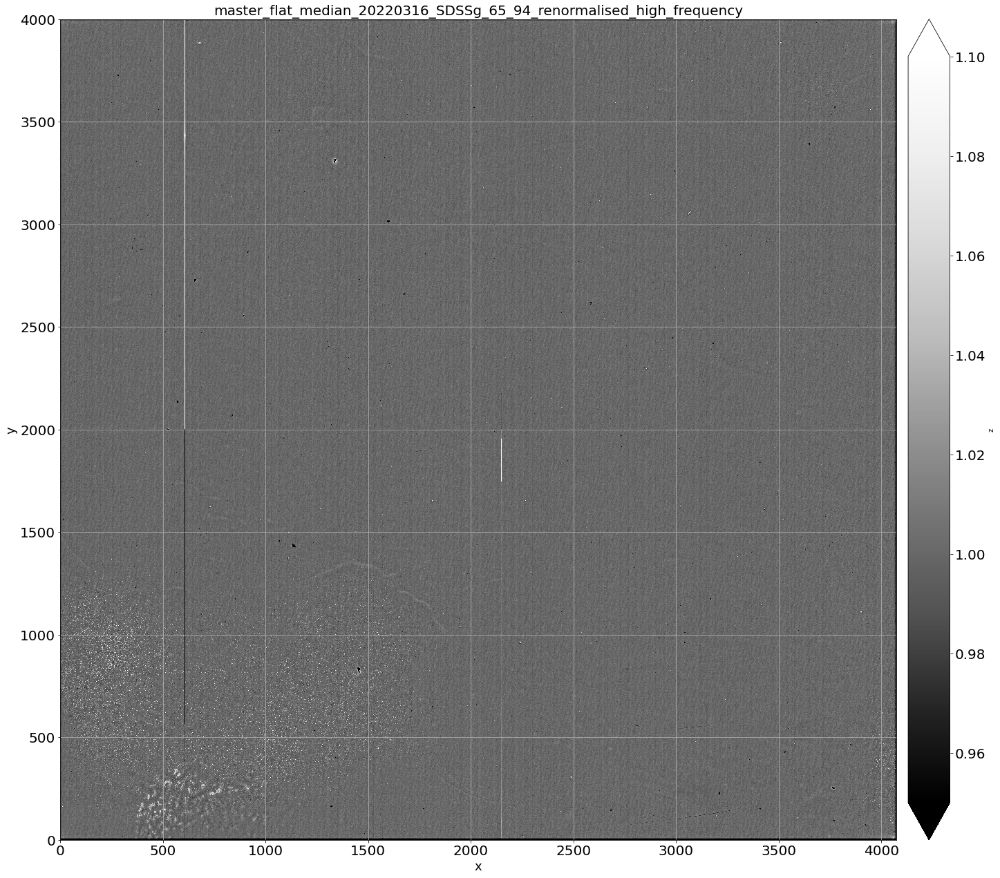

In [101]:
img